https://poloclub.github.io/ganlab/

In [15]:
import tensorflow as tf


# maintain consistent performance
tf.random.set_seed(1)

# confirm GPU is available
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


Setup – Upload Your Images

📤 Upload your images


Saving khurram_pic_IIT_Roorkee.jpg to khurram_pic_IIT_Roorkee (2).jpg
✅ Images uploaded to /content/images/


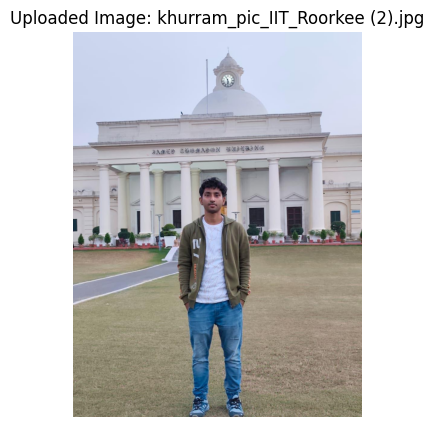

In [12]:
from google.colab import files
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
print("📤 Upload your images")
uploaded = files.upload()

# Save uploaded images to a folder
image_folder = "/content/images/"
os.makedirs(image_folder, exist_ok=True)

for file_name in uploaded.keys():
    img = Image.open(file_name).convert("RGB")
    img.save(os.path.join(image_folder, file_name))

print("✅ Images uploaded to", image_folder)

for file_name in uploaded.keys():
    img_path = os.path.join(image_folder, file_name)
    img = Image.open(img_path)

    plt.figure(figsize=(5, 5))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"Uploaded Image: {file_name}")
    plt.show()


# **Face Generation (StyleGAN)**

Note: StyleGAN is complex and requires pre-trained models. We can use stylegan2_pytorch for a simple demo.

In [ ]:
# 1 Install StyleGAN2 PyTorch
!pip install stylegan2_pytorch --quiet

In [29]:
import os
from PIL import Image
from google.colab import files

# Ask user how many images they want to upload
num_images = int(input("How many images do you want to upload? "))

# Base folder for StyleGAN2
image_folder = "/content/images/"
os.makedirs(image_folder, exist_ok=True)

uploaded_files = []

# Upload images
for i in range(num_images):
    print(f"Upload image {i+1}/{num_images}")
    uploaded = files.upload()
    for file_name in uploaded.keys():
        img_path = os.path.join(image_folder, file_name)
        img = Image.open(file_name).convert("RGB")
        img.save(img_path)
        uploaded_files.append(img_path)

print(f"✅ {len(uploaded_files)} image(s) uploaded and saved to {image_folder}")


# Augmentation function
def augment_image(img_path, save_dir, count=5):
    img = Image.open(img_path)
    for i in range(count):
        aug = img.copy()
        if i % 2 == 0:
            aug = aug.transpose(Image.FLIP_LEFT_RIGHT)
        aug = aug.rotate(i*10)
        aug.save(os.path.join(save_dir, f"aug_{os.path.basename(img_path).split('.')[0]}_{i}.jpg"))

# Only augment image files (ignore directories)
for file_name in os.listdir(image_folder):
    file_path = os.path.join(image_folder, file_name)
    if os.path.isfile(file_path):   # <-- important check
        augment_image(file_path, image_folder, count=5)

print("✅ Tiny dataset ready for GAN training")




How many images do you want to upload? 2
Upload image 1/2


Saving khurram_pic_IIT_Roorkee.jpg to khurram_pic_IIT_Roorkee (3).jpg
Upload image 2/2


Saving khurram_pic_delhi.jpeg to khurram_pic_delhi (1).jpeg
✅ 2 image(s) uploaded and saved to /content/images/
✅ Tiny dataset ready for GAN training


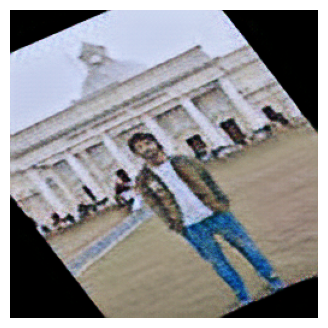

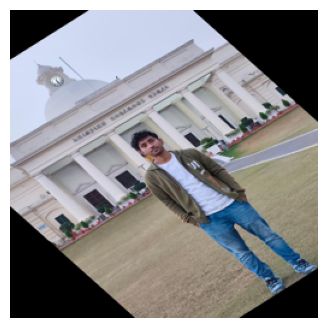

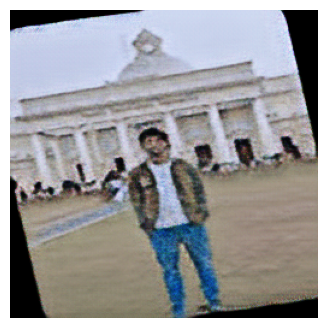

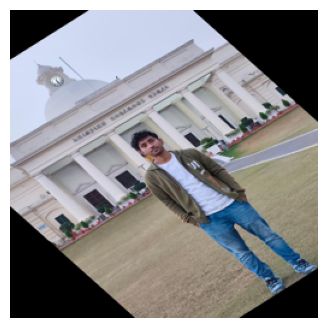

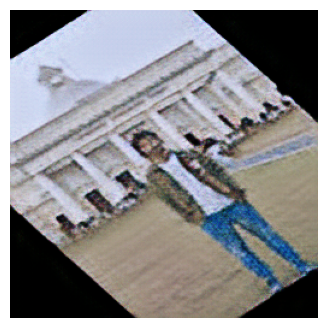

...

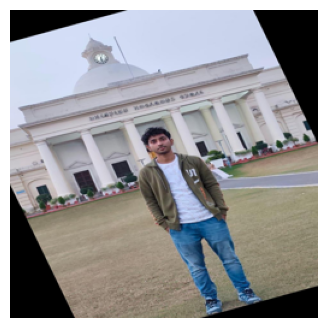

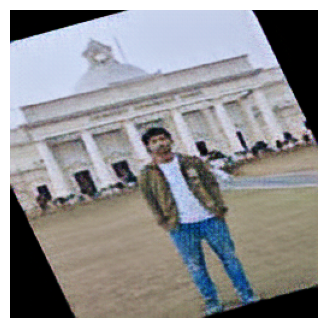

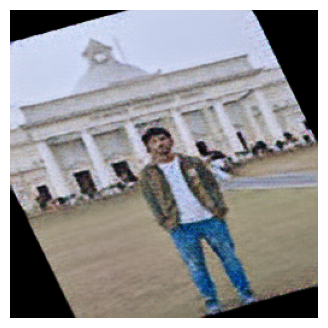

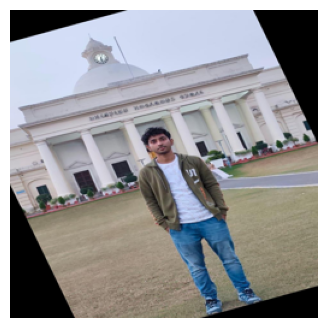

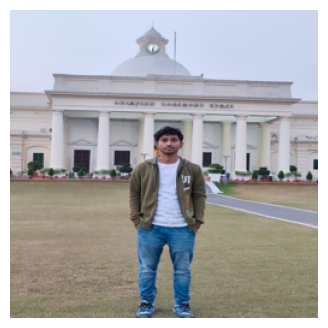

In [30]:
#Training
from stylegan2_pytorch import Trainer

trainer = Trainer(
    image_size=64,           # small size for Colab
    network_capacity=16,     # small network for demo
    batch_size=4,
    gradient_accumulate_every=2,
)

trainer.set_data_src(image_folder)
trainer.train()


#visualize
import matplotlib.pyplot as plt

results_dir = "./results"
for root, dirs, files in os.walk(results_dir):
    for file in files:
        if file.endswith(".png"):
            img = Image.open(os.path.join(root, file))
            plt.figure(figsize=(4,4))
            plt.imshow(img)
            plt.axis("off")
            plt.show()


# **Image-to-Image Translation (CycleGAN)**

CycleGAN is for transforming one style to another (e.g., horses → zebras).

In [24]:
# 1️⃣ Install dependencies
!pip install dominate torch torchvision --quiet

# 2️⃣ Clone the CycleGAN repo
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix.git
%cd pytorch-CycleGAN-and-pix2pix

# 3️⃣ Upload your image
from google.colab import files
uploaded = files.upload()

import os
from PIL import Image
import shutil

image_folder = "/content/images/"
os.makedirs(image_folder, exist_ok=True)

# Save uploaded image
for file_name in uploaded.keys():
    img_path = os.path.join(image_folder, file_name)
    img = Image.open(file_name).convert("RGB")
    img.save(img_path)
    uploaded_image = img_path

# 4️⃣ Create required folder structure
folders = ["trainA", "trainB", "testA", "testB"]
for f in folders:
    os.makedirs(os.path.join(image_folder, f), exist_ok=True)

# 5️⃣ Duplicate & augment the image to simulate small dataset
def augment_image(img_path, save_dir, count=5):
    img = Image.open(img_path)
    for i in range(count):
        aug = img.copy()
        # Simple augmentations: rotate, flip
        if i % 2 == 0:
            aug = aug.transpose(Image.FLIP_LEFT_RIGHT)
        aug = aug.rotate(i*10)
        aug.save(os.path.join(save_dir, f"aug_{i}.jpg"))

for f in folders:
    augment_image(uploaded_image, os.path.join(image_folder, f), count=5)

print("✅ Folder structure ready with augmented images")

# 6️⃣ Train CycleGAN
!python train.py --dataroot /content/images --name my_cyclegan --model cycle_gan --load_size 128 --crop_size 128 --batch_size 1

# 7️⃣ Test CycleGAN and visualize
!python test.py --dataroot /content/images --name my_cyclegan --model cycle_gan --phase test


Cloning into 'pytorch-CycleGAN-and-pix2pix'...
remote: Enumerating objects: 2619, done.
remote: Counting objects: 100% (70/70), done.
remote: Compressing objects: 100% (50/50), done.
remote: Total 2619 (delta 33), reused 20 (delta 20), pack-reused 2549 (from 2)
Receiving objects: 100% (2619/2619), 8.29 MiB | 38.74 MiB/s, done.
Resolving deltas: 100% (1621/1621), done.
/content/pytorch-CycleGAN-and-pix2pix/pytorch-CycleGAN-and-pix2pix/pytorch-CycleGAN-and-pix2pix


Saving khurram_pic_IIT_Roorkee.jpg to khurram_pic_IIT_Roorkee.jpg
✅ Folder structure ready with augmented images
----------------- Options ---------------
               batch_size: 1                             
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 128                           	[default: 256]
                 dataroot: /content/images               	[default: None]
             dataset_mode: unaligned                     
                direction: AtoB                          
             display_freq: 400                           
          display_winsize: 256                           
                    epoch: latest                        
              epoch_count: 1                             
                 gan_mode: lsgan                         
                init_gain: 0.02                          
  

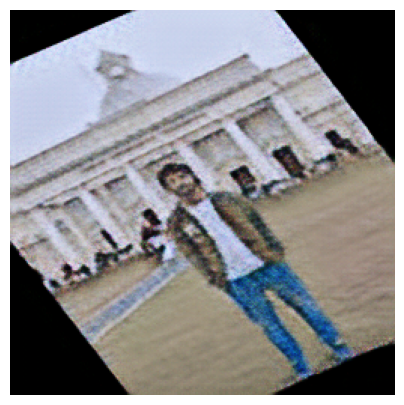

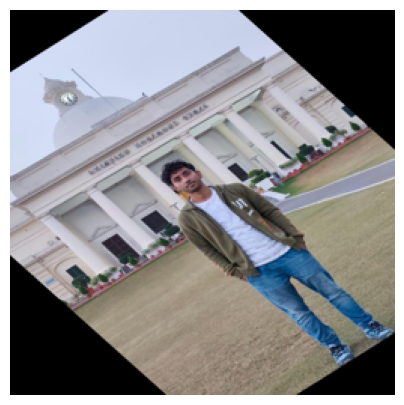

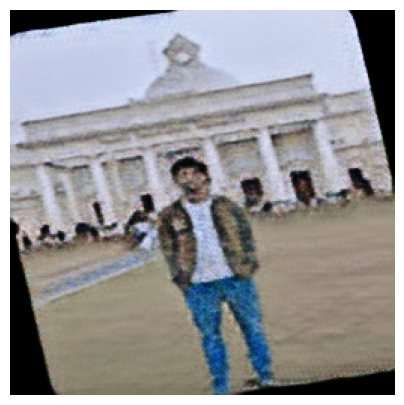

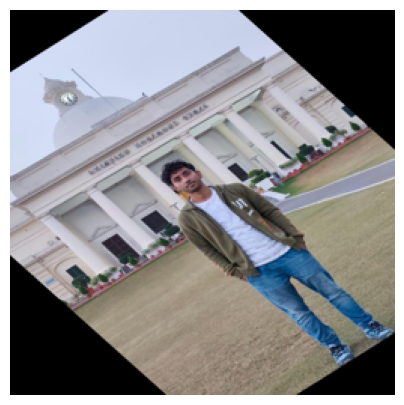

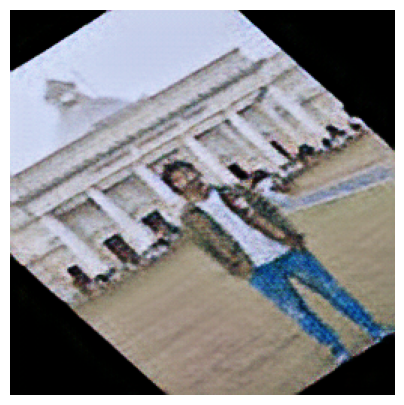

...

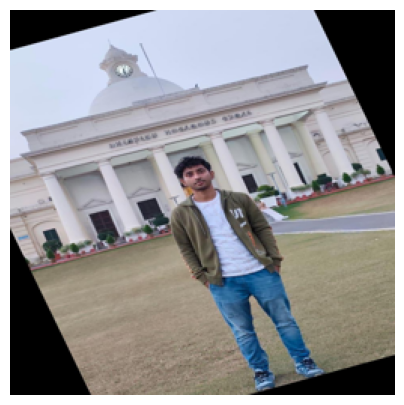

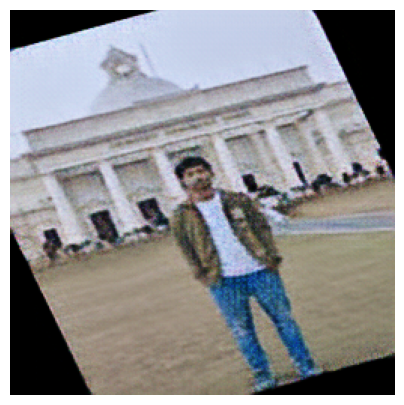

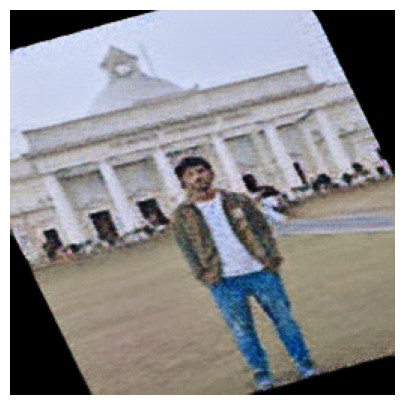

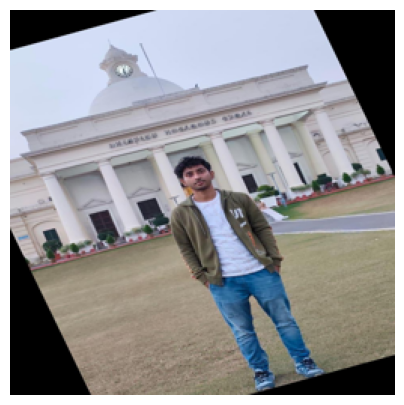

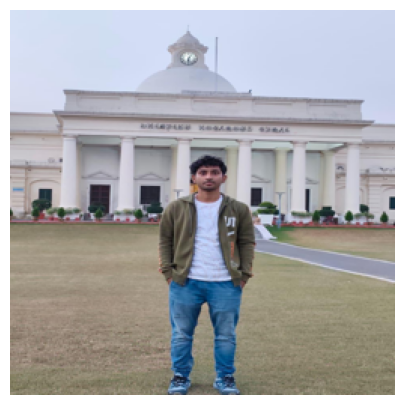

In [25]:
import matplotlib.pyplot as plt

results_dir = "./results/my_cyclegan/test_latest/images/"
for img_file in os.listdir(results_dir):
    if img_file.endswith(".png"):
        img = Image.open(os.path.join(results_dir, img_file))
        plt.figure(figsize=(5,5))
        plt.imshow(img)
        plt.axis("off")
        plt.show()


# **Super-Resolution (SRGAN)**

In [32]:
!pip install tensorflow tensorflow_hub matplotlib --quiet

How many images do you want to super-resolve? 1
Upload image 1/1


Saving khurram_pic_delhi.jpeg to khurram_pic_delhi (2).jpeg
✅ 1 image(s) uploaded successfully.

Processing /content/images/khurram_pic_delhi (2).jpeg...


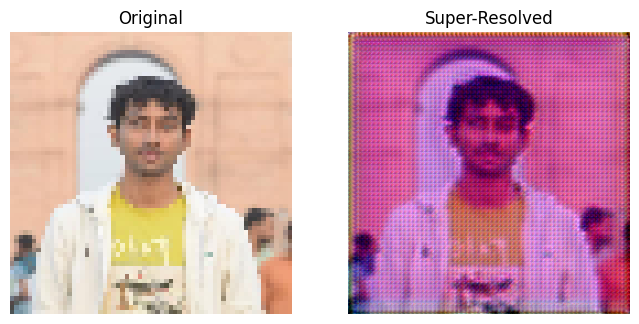

In [33]:
# Install required packages
# !pip install tensorflow tensorflow_hub matplotlib --quiet

import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from google.colab import files
import os

# Ask user how many images they want to upload
num_images = int(input("How many images do you want to super-resolve? "))

# Create folder to store uploaded images
image_folder = "/content/images/"
os.makedirs(image_folder, exist_ok=True)

uploaded_files = []

# Upload images
for i in range(num_images):
    print(f"Upload image {i+1}/{num_images}")
    uploaded = files.upload()
    for file_name in uploaded.keys():
        img_path = os.path.join(image_folder, file_name)
        # Save image
        img = load_img(file_name)
        img.save(img_path)
        uploaded_files.append(img_path)

print(f"✅ {len(uploaded_files)} image(s) uploaded successfully.\n")

# Load ESRGAN model from TensorFlow Hub
srgan_model = hub.load("https://tfhub.dev/captain-pool/esrgan-tf2/1")

# Process and visualize each uploaded image
for img_path in uploaded_files:
    print(f"Processing {img_path}...")
    img = load_img(img_path, target_size=(64,64))
    img = img_to_array(img) / 255.0
    img = tf.expand_dims(img, axis=0)

    # Super-resolve
    sr_img = srgan_model(img)

    # Visualize
    plt.figure(figsize=(8,4))
    plt.subplot(1,2,1)
    plt.title("Original")
    plt.imshow(tf.clip_by_value(img[0],0,1))
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.title("Super-Resolved")
    plt.imshow(tf.clip_by_value(sr_img[0],0,1))
    plt.axis("off")

    plt.show()


# **Text-to-Image Generation**

For text → image, use Stable Diffusion or DALL·E Mini.

In [5]:
!pip install diffusers transformers

In [6]:


from diffusers import StableDiffusionPipeline
import torch

pipe = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16)
pipe = pipe.to("cuda")

prompt = "A futuristic city, neon lights"
image = pipe(prompt).images[0]

# Save and display
image.save("generated_image.png")
image.show()


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/50 [00:00<?, ?it/s]

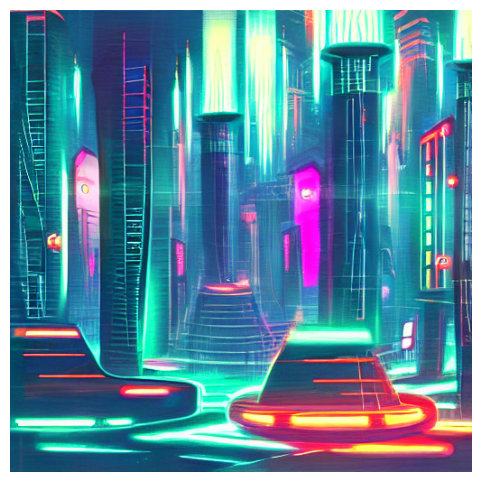

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(image)
plt.axis("off")
plt.show()

# **Data Augmentation with GANs**

You can generate variations of your images using a trained GAN or even simple transformations.

In [ ]:
!pip install tensorflow --quiet

In [34]:


import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from google.colab import files

# Ask user how many images
num_images = int(input("How many images do you want to augment? "))

# Create folders
original_folder = "/content/images/"
aug_folder = "/content/augmented/"
os.makedirs(original_folder, exist_ok=True)
os.makedirs(aug_folder, exist_ok=True)

uploaded_files = []

# Upload images
for i in range(num_images):
    print(f"Upload image {i+1}/{num_images}")
    uploaded = files.upload()
    for file_name in uploaded.keys():
        img_path = os.path.join(original_folder, file_name)
        img = load_img(file_name, target_size=(64,64))
        img.save(img_path)
        uploaded_files.append(img_path)

print(f"✅ {len(uploaded_files)} image(s) uploaded.")

# Define augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.2,
    horizontal_flip=True
)

# Augment each image
for img_path in uploaded_files:
    img_array = img_to_array(load_img(img_path, target_size=(64,64)))
    img_array = img_array.reshape((1,) + img_array.shape)

    i = 0
    for batch in datagen.flow(img_array, batch_size=1, save_to_dir=aug_folder,
                              save_prefix='aug', save_format='png'):
        i += 1
        if i >= 10:  # generate 10 augmented images per input
            break

print(f"✅ Augmentation done. Augmented images saved to {aug_folder}")


How many images do you want to augment? 2
Upload image 1/2


Saving khurram_pic_IIT_Roorkee.jpg to khurram_pic_IIT_Roorkee (4).jpg
Upload image 2/2


Saving khurram_pic_delhi.jpeg to khurram_pic_delhi (3).jpeg
✅ 2 image(s) uploaded.
✅ Augmentation done. Augmented images saved to /content/augmented/


Total augmented images: 20


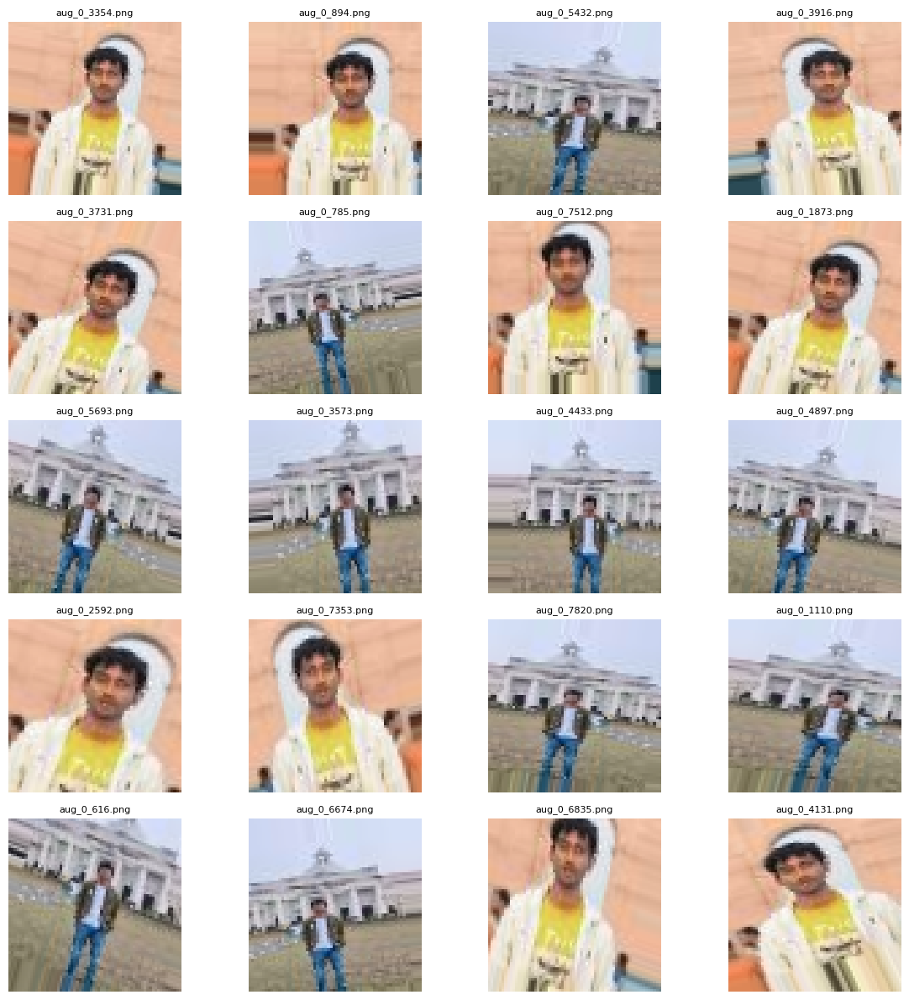

In [35]:
import os
from PIL import Image
import matplotlib.pyplot as plt

aug_folder = "/content/augmented/"

# List all augmented images
aug_images = [f for f in os.listdir(aug_folder) if f.endswith((".png", ".jpg", ".jpeg"))]

print(f"Total augmented images: {len(aug_images)}")

# Display augmented images
plt.figure(figsize=(12, 12))
for i, img_file in enumerate(aug_images[:20]):  # show up to 20 images
    img_path = os.path.join(aug_folder, img_file)
    img = Image.open(img_path)

    plt.subplot(5, 4, i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(img_file, fontsize=8)
plt.tight_layout()
plt.show()


# **Summary of Workflow**

Upload your images → /content/images/

Face Generation: StyleGAN → new faces

Image Translation: CycleGAN → style transfer

Super-Resolution: SRGAN → upscale images

Text-to-Image: Stable Diffusion → generate from prompt

Data Augmentation: ImageDataGenerator → variations



